# 1. Without Non-Maximum Suppression (NMS)

In [ ]:
!pip install opencv-python-headless

In [ ]:
!wget -O yolov3.cfg https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg
!wget -O yolov3.weights https://pjreddie.com/media/files/yolov3.weights # Corrected download URL
!wget -O coco.names https://raw.githubusercontent.com/pjreddie/darknet/master/data/coco.names

--2025-03-20 09:14:18--  https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8342 (8.1K) [text/plain]
Saving to: ‘yolov3.cfg’

yolov3.cfg          100%[===================>]   8.15K  --.-KB/s    in 0s      

2025-03-20 09:14:18 (94.6 MB/s) - ‘yolov3.cfg’ saved [8342/8342]

--2025-03-20 09:14:18--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 162.0.215.52
Connecting to pjreddie.com (pjreddie.com)|162.0.215.52|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  15.3MB/s    in 17s     

2025-03-20 09:1

In [ ]:
import cv2
import numpy as np

net = cv2.dnn.readNetFromDarknet("yolov3.cfg", "yolov3.weights")

with open("coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

print("Detected classes:", classes)

Detected classes: ['person', 'bicycle', 'car', 'motorbike', 'aeroplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'sofa', 'pottedplant', 'bed', 'diningtable', 'toilet', 'tvmonitor', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


In [ ]:
from google.colab import files
import io

# Prompt user to upload an image
uploaded = files.upload()

# Read the first uploaded image
for file in uploaded.keys():
    image = cv2.imread(file)
    break

# Convert image from BGR to RGB (for proper visualization if needed)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

Saving traffic-7272520_1920.jpg to traffic-7272520_1920.jpg


In [ ]:
# Create a blob from the image with higher resolution (e.g., 608x608)
blob = cv2.dnn.blobFromImage(image, 1/255.0, (608, 608), swapRB=True, crop=False)
# Set the blob as input to the network
net.setInput(blob)

# Get the names of the output layers
layer_names = net.getLayerNames()
# Get the indices of the output layers, reshaping if needed
output_layers_indices = net.getUnconnectedOutLayers()
# If output_layers_indices is a NumPy array with a single dimension, reshape it
if isinstance(output_layers_indices, np.ndarray) and output_layers_indices.ndim == 1:
    output_layers_indices = output_layers_indices.reshape(1, -1)
# Access the layer names using the indices
output_layers = [layer_names[i[0] - 1] for i in output_layers_indices]


# Run the forward pass to get the outputs
outputs = net.forward(output_layers)
print(outputs)

(array([[0.02750801, 0.0350136 , 0.26083356, ..., 0.        , 0.        ,
        0.        ],
       [0.03202345, 0.02549956, 0.18806915, ..., 0.        , 0.        ,
        0.        ],
       [0.03030795, 0.02707741, 0.47154275, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.97561526, 0.96907026, 0.30803484, ..., 0.        , 0.        ,
        0.        ],
       [0.9778617 , 0.97375447, 0.20951398, ..., 0.        , 0.        ,
        0.        ],
       [0.98106253, 0.9749773 , 0.5675723 , ..., 0.        , 0.        ,
        0.        ]], dtype=float32),)


In [ ]:
# Initialize lists for detected bounding boxes, confidences, and class IDs
class_ids = []
confidences = []
boxes = []

height, width = image.shape[:2]

# Iterate over each of the layer outputs
for output in outputs:
    for detection in output:
        scores = detection[5:]
        class_id = np.argmax(scores)
        confidence = scores[class_id]

        # Filter out weak detections by ensuring the confidence is above a threshold
        if confidence > 0.3:
            # Scale the bounding box coordinates back relative to the image size
            center_x = int(detection[0] * width)
            center_y = int(detection[1] * height)
            w = int(detection[2] * width)
            h = int(detection[3] * height)

            # Calculate the top-left corner of the bounding box
            x = int(center_x - w / 2)
            y = int(center_y - h / 2)

            boxes.append([x, y, w, h])
            confidences.append(float(confidence))
            class_ids.append(class_id)



In [ ]:
# Loop over the indices kept by NMS and draw bounding boxes and labels
if len(indexes) > 0:
    for i in indexes.flatten():
        x, y, w, h = boxes[i]
        label = str(classes[class_ids[i]])
        confidence = confidences[i]
        color = (255, 255, 0)  # You can choose any color (B, G, R)

        # Draw the bounding box rectangle and label on the image
        cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
        cv2.putText(image, f"{label} {confidence:.2f}", (x, y - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)


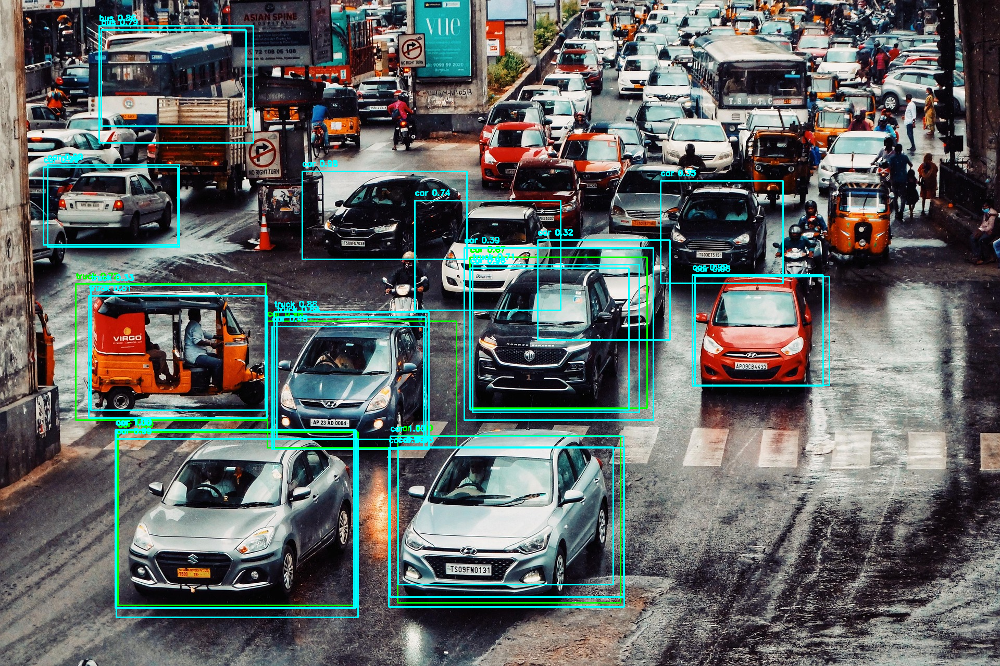

In [ ]:
from google.colab.patches import cv2_imshow

# Display the image with detected objects
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()


# 2. Using Non-Maximum Suppression (NMS)

In [ ]:
from google.colab import files
import io

# Prompt user to upload an image
uploaded = files.upload()

# Read the first uploaded image
for file in uploaded.keys():
    image = cv2.imread(file)
    break

# Convert image from BGR to RGB (for proper visualization if needed)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

Saving traffic-7272520_1920.jpg to traffic-7272520_1920 (1).jpg


In [ ]:
# Create a blob from the image with higher resolution (e.g., 608x608)
blob = cv2.dnn.blobFromImage(image, 1/255.0, (608, 608), swapRB=True, crop=False)
# Set the blob as input to the network
net.setInput(blob)

# Get the names of the output layers
layer_names = net.getLayerNames()
# Get the indices of the output layers, reshaping if needed
output_layers_indices = net.getUnconnectedOutLayers()
# If output_layers_indices is a NumPy array with a single dimension, reshape it
if isinstance(output_layers_indices, np.ndarray) and output_layers_indices.ndim == 1:
    output_layers_indices = output_layers_indices.reshape(1, -1)
# Access the layer names using the indices
output_layers = [layer_names[i[0] - 1] for i in output_layers_indices]


# Run the forward pass to get the outputs
outputs = net.forward(output_layers)
print(outputs)

(array([[0.02865644, 0.03908664, 0.23522352, ..., 0.        , 0.        ,
        0.        ],
       [0.03265126, 0.02610642, 0.19270077, ..., 0.        , 0.        ,
        0.        ],
       [0.02920933, 0.02821063, 0.47194716, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.9754524 , 0.968779  , 0.30841663, ..., 0.        , 0.        ,
        0.        ],
       [0.97750735, 0.9739185 , 0.20842786, ..., 0.        , 0.        ,
        0.        ],
       [0.9808555 , 0.974981  , 0.56743366, ..., 0.        , 0.        ,
        0.        ]], dtype=float32),)


In [ ]:
# Initialize lists for detected bounding boxes, confidences, and class IDs
class_ids = []
confidences = []
boxes = []

height, width = image.shape[:2]

# Iterate over each of the layer outputs
for output in outputs:
    for detection in output:
        scores = detection[5:]
        class_id = np.argmax(scores)
        confidence = scores[class_id]

        # Filter out weak detections by ensuring the confidence is above a threshold
        if confidence > 0.4:
            # Scale the bounding box coordinates back relative to the image size
            center_x = int(detection[0] * width)
            center_y = int(detection[1] * height)
            w = int(detection[2] * width)
            h = int(detection[3] * height)

            # Calculate the top-left corner of the bounding box
            x = int(center_x - w / 2)
            y = int(center_y - h / 2)

            boxes.append([x, y, w, h])
            confidences.append(float(confidence))
            class_ids.append(class_id)

# Non-Maximum Suppression (NMS)
indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)



In [ ]:
# Loop over the indices kept by NMS and draw bounding boxes and labels
if len(indexes) > 0:
    for i in indexes.flatten():
        x, y, w, h = boxes[i]
        label = str(classes[class_ids[i]])
        confidence = confidences[i]
        color = (255, 255, 0)  # You can choose any color (B, G, R)

        # Draw the bounding box rectangle and label on the image
        cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
        cv2.putText(image, f"{label} {confidence:.2f}", (x, y - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)


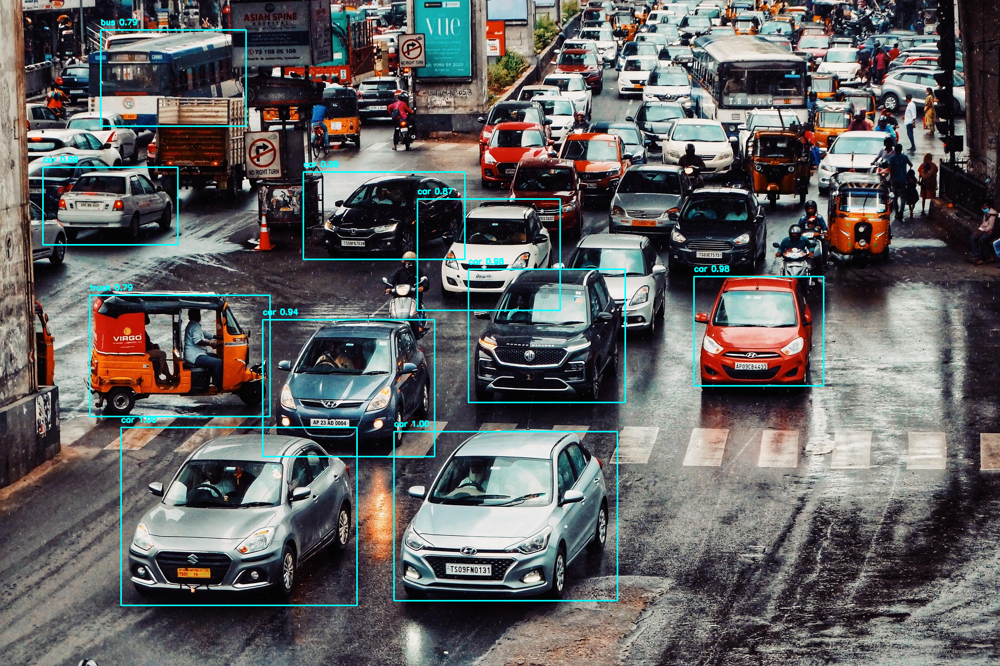

In [ ]:
from google.colab.patches import cv2_imshow

# Display the image with detected objects
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()
